In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install git+https://github.com/facebookresearch/detectron2.git

Looking in indexes: https://download.pytorch.org/whl/cu118
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-aj6d7gos
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-aj6d7gos
  Resolved https://github.com/facebookresearch/detectron2.git to commit ebe8b45437f86395352ab13402ba45b75b4d1ddb
  Preparing metadata (setup.py) ... done


In [ ]:
import os
import torch
import detectron2
import cv2
import json
import numpy as np
import random

from detectron2.utils.logger import setup_logger
setup_logger()
from google.colab.patches import cv2_imshow
from detectron2.utils.visualizer import Visualizer
from detectron2.checkpoint import DetectionCheckpointer
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

In [ ]:
def get_mapillary_dicts(img_dir, annotation_dir):
    dataset_dicts = []
    for idx, filename in enumerate(os.listdir(img_dir)):
        record = {}
        jpg_path = os.path.join(img_dir, filename)
        filename_base = filename.split(".")[0]
        png_path = os.path.join(annotation_dir, f"{filename_base}.png")

        height, width = cv2.imread(jpg_path).shape[:2]

        record["file_name"] = jpg_path
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        objs = []
        # Assuming label map contains instance segmentation mask
        mask = cv2.imread(png_path, 0)
        for segment_id in np.unique(mask):
            if segment_id == 0:  # Background label
                continue

            segmentation_mask = mask == segment_id
            contours, _ = cv2.findContours(segmentation_mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

            for contour in contours:
                if len(contour) < 3:
                    continue
                obj = {
                    "bbox": cv2.boundingRect(contour),
                    "bbox_mode": BoxMode.XYWH_ABS,
                    "segmentation": [contour.flatten().tolist()],
                    "category_id": segment_id - 1,  # Subtract 1 to adjust category ID
                    "iscrowd": 0,
                }
                objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)

    return dataset_dicts

In [ ]:
thing_classes = ["Bird", "Ground Animal", "Person", "Bicyclist", "Car", "Motorcycle", "Truck", "Other Vehicle", "Traffic Sign", "Traffic Light", "Building", "Fence", "Pole", "Sidewalk", "Vegetation", "Terrain", "Sky", "Road", "Lane Marking", "Crosswalk", "Water", "Bridge", "Tunnel", "Railroad", "Guard Rail", "Manhole", "Catch Basin", "Pothole", "Curb", "Parking Meter", "Bench", "Animal", "Bicycle", "Boat", "Bus", "Caravan", "Construction Vehicle", "Emergency Vehicle", "Motorcycle", "Rickshaw", "Sign", "Train", "Tram", "Wheeled Slow", "Barrier", "Bike Lane", "Crosswalk Plain", "Curb Cut", "Driveway", "Parking", "Parking Aisle", "Pedestrian Area", "Rail Track", "Road Shoulder", "Service Lane", "Traffic Island", "Give Way Sign", "Stop Sign", "Street Light", "Other Ground", "Dynamic", "Ego Vehicle", "Static", "Ground", "Construction"]

In [ ]:
for d in ["training", "validation"]:
    if f"mapillary_{d}" not in DatasetCatalog: # Check if the dataset is already registered
        DatasetCatalog.register(f"mapillary_{d}", lambda d=d: get_mapillary_dicts(f"/content/drive/MyDrive/MapillaryVistas/{d}/images",
                                                                                 f"/content/drive/MyDrive/MapillaryVistas/{d}/instances"))
        MetadataCatalog.get(f"mapillary_{d}").set(thing_classes=thing_classes)

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("mapillary_training",)
cfg.DATASETS.TEST = ("mapillary_validation",)  # No testing dataset provided
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.SOLVER.CHECKPOINT_PERIOD = 200
cfg.MODEL.DEVICE = "cuda"  # Use GPU else cpu
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # Adjust for memory limits
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(MetadataCatalog.get("mapillary_training").thing_classes)  # Number of classes
cfg.OUTPUT_DIR = "/content/drive/MyDrive/MapillaryVistas/output"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/02 11:19:32 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 216MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[10/02 11:24:35 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[10/02 11:25:00 d2.utils.events]:  eta: 0:13:26  iter: 19  total_loss: 8.69  loss_cls: 4.302  loss_box_reg: 0.4102  loss_mask: 0.6924  loss_rpn_cls: 2.031  loss_rpn_loc: 1.271    time: 0.8788  last_time: 0.7269  data_time: 0.2801  last_data_time: 0.0790   lr: 4.9953e-06  max_mem: 3902M
[10/02 11:25:23 d2.utils.events]:  eta: 0:14:09  iter: 39  total_loss: 8.027  loss_cls: 4.186  loss_box_reg: 0.41  loss_mask: 0.6922  loss_rpn_cls: 1.524  loss_rpn_loc: 1.157    time: 0.9083  last_time: 1.1296  data_time: 0.1922  last_data_time: 0.3573   lr: 9.9902e-06  max_mem: 3902M
[10/02 11:25:42 d2.utils.events]:  eta: 0:14:11  iter: 59  total_loss: 7.764  loss_cls: 3.937  loss_box_reg: 0.3923  loss_mask: 0.6917  loss_rpn_cls: 1.477  loss_rpn_loc: 1.208    time: 0.9136  last_time: 1.1026  data_time: 0.2360  last_data_time: 0.4433   lr: 1.4985e-05  max_mem: 3902M
[10/02 11:26:01 d2.utils.events]:  eta: 0:13:53  iter: 79  total_loss: 6.553  loss_cls: 3.547  loss_box_reg: 0.3941  loss_mask: 0.6908  los

In [ ]:
# Directory to save the model
output_dir = cfg.OUTPUT_DIR
os.makedirs(output_dir, exist_ok=True)

# Save the model weights
checkpointer = DetectionCheckpointer(trainer.model, save_dir=output_dir)
checkpointer.save("my_final_model")

print(f"Model saved at: {os.path.join(output_dir, 'my_final_model.pth')}")

Model saved at: /content/drive/MyDrive/MapillaryVistas/output/my_final_model.pth


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # Set a threshold for evaluation
predictor = DefaultPredictor(cfg)

# Load and evaluate
evaluator = COCOEvaluator("mapillary_validation", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "mapillary_validation")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[10/02 11:48:45 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/MapillaryVistas/output/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

WARNING [10/02 11:48:46 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[10/02 11:48:46 d2.evaluation.coco_evaluation]: Trying to convert 'mapillary_validation' to COCO format ...
[10/02 11:48:46 d2.data.datasets.coco]: Converting annotations of dataset 'mapillary_validation' to COCO format ...)
[10/02 11:50:18 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[10/02 11:50:22 d2.data.datasets.coco]: Conversion finished, #images: 200, #annotations: 35692
[10/02 11:50:22 d2.data.datasets.coco]: Caching COCO format annotations at '/content/drive/MyDrive/MapillaryVistas/output/mapillary_validation_coco_format.json' ...
[10/02 11:52:02 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[10/02 11:52:02 d2.data.common]: Serializing the dataset using: <class 'detectron2.d

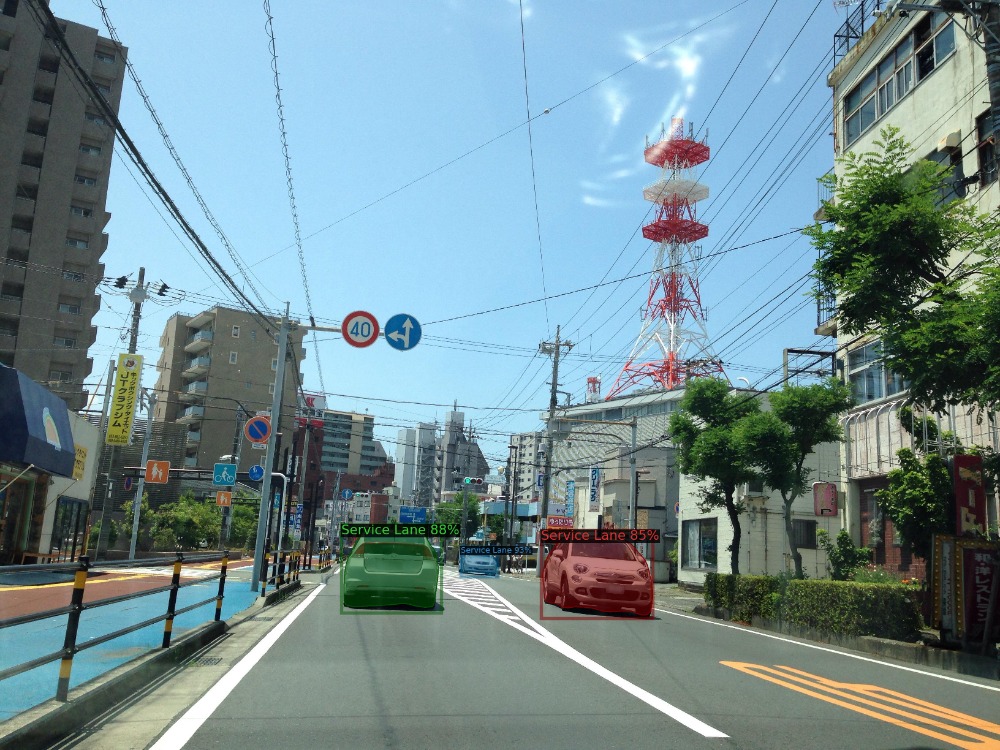

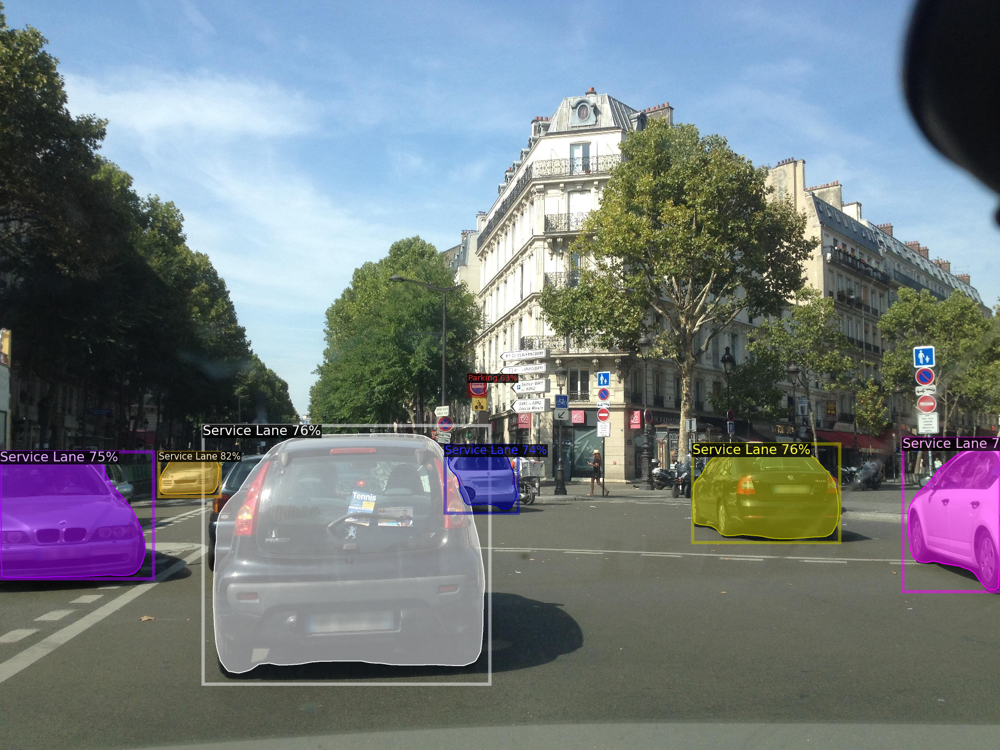

In [ ]:
# Get dataset
dataset_dicts = get_mapillary_dicts("/content/drive/MyDrive/MapillaryVistas/validation/images",
                                    "/content/drive/MyDrive/MapillaryVistas/validation/instances")

# Limit to the first 2 images
for d in dataset_dicts[:2]:
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)

    # Visualize predictions
    v = Visualizer(im[:, :, ::-1], MetadataCatalog.get("mapillary_validation"), scale=0.5)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Show the image with predictions
    cv2_imshow(out.get_image()[:, :, ::-1])

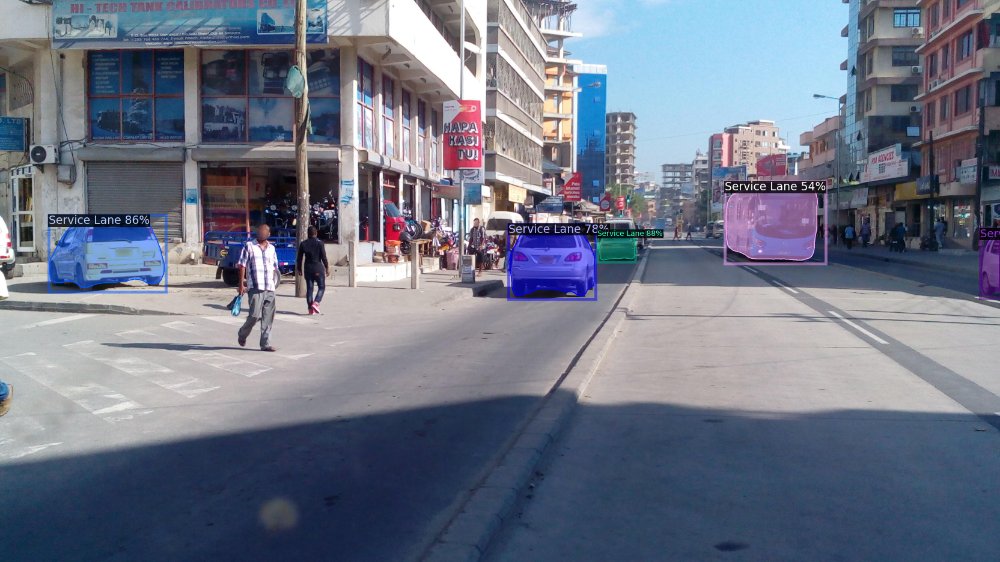

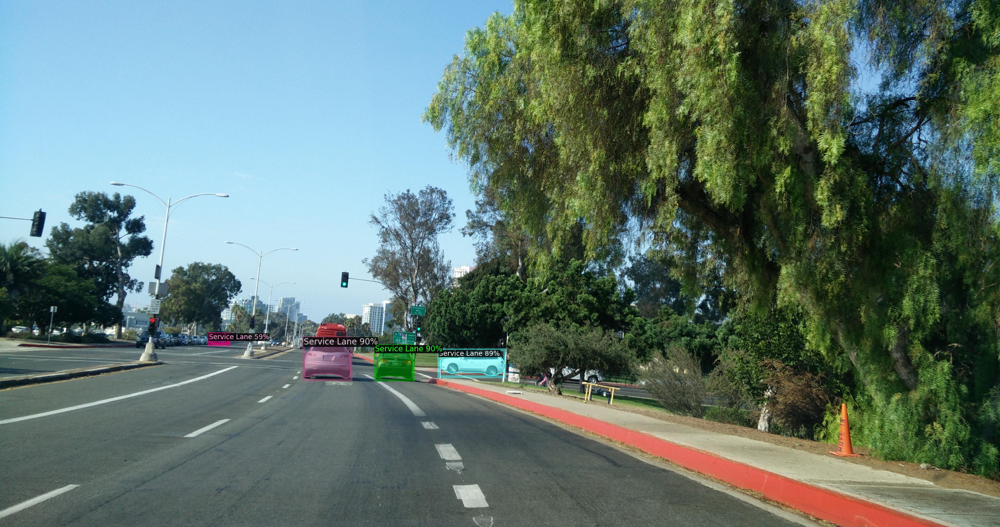

In [ ]:
# Load the dataset dictionary
dataset_dicts = get_mapillary_dicts(
    "/content/drive/MyDrive/MapillaryVistas/validation/images",
    "/content/drive/MyDrive/MapillaryVistas/validation/instances"
)

# Randomly shuffle the dataset dictionary
random.shuffle(dataset_dicts)

# Select only 2 random images
for d in dataset_dicts[:2]:  # Select the first two images after shuffling
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)

    v = Visualizer(im[:, :, ::-1], MetadataCatalog.get("mapillary_validation"), scale=0.5)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])